In [1]:
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import torch.nn.functional as F
from torchvision.utils import make_grid
from tqdm import tqdm
from torchvision.models import vgg16, vgg19

# Set random seed for reproducibility
#manualSeed = 999
manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True)

Random Seed:  4964


In [2]:
DATASET = "STL-10"

# Root directory for dataset
dataroot = "./data"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3 if DATASET == "CIFAR10" or DATASET == "STL-10" else 1

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 100

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.6

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [3]:
if DATASET == 'MNIST':
    transform = transforms.Compose([
                                 transforms.Resize(image_size),
                                 transforms.CenterCrop(image_size),
                                 transforms.ToTensor(),
                                 transforms.Normalize((0.5,), (0.5,)),
                            ])
    trainset = dset.MNIST(root=dataroot, train=True, download=True, transform=transform)
    testset = dset.MNIST(root=dataroot, train=False, download=True, transform=transform)
elif DATASET == 'CIFAR10':
    transform = transforms.Compose([
                                 transforms.Resize(image_size),
                                 transforms.CenterCrop(image_size),
                                 transforms.ToTensor(),
                                 transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                            ])
    trainset = dset.CIFAR10(root=dataroot, train=True, download=True, transform=transform)
    testset = dset.CIFAR10(root=dataroot, train=False, download=True, transform=transform)
elif DATASET == 'FashionMNIST':
    transform = transforms.Compose([
                                 transforms.Resize(image_size),
                                 transforms.CenterCrop(image_size),
                                 transforms.ToTensor(),
                                 transforms.Normalize((0.5,), (0.5,)),
                            ])
    trainset = dset.FashionMNIST(root=dataroot, train=True, download=True, transform=transform)
    testset = dset.FashionMNIST(root=dataroot, train=False, download=True, transform=transform)
    
elif DATASET == 'STL-10':
    transform = transforms.Compose([
                                transforms.Resize(image_size),
                                transforms.RandomHorizontalFlip(),
                                transforms.RandomCrop(image_size, padding=4),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                            ])
    trainset = dset.STL10(root=dataroot, split= "unlabeled", download=True, transform=transform)
    
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers = workers) # , num_workers=2
#testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size, shuffle=False, num_workers = workers) # , num_workers=2

Files already downloaded and verified


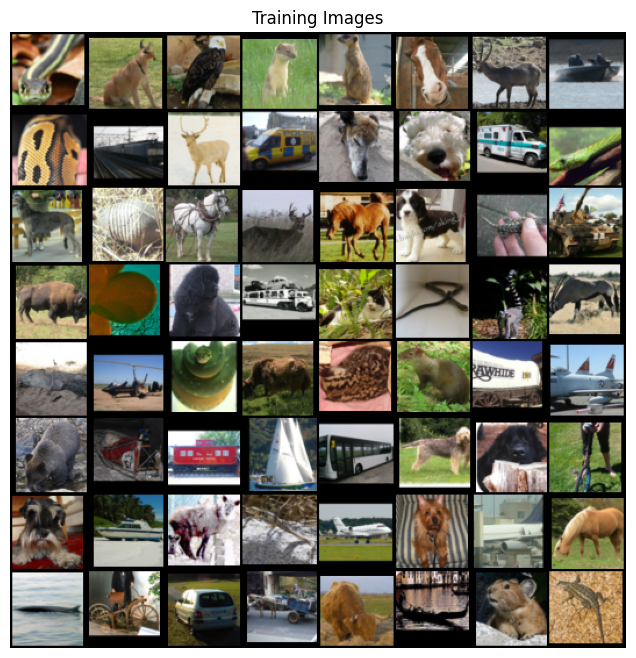

In [4]:
# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(trainloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

In [5]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv2D') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)
    

In [6]:
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super().__init__()
        self.layers = nn.ModuleList([nn.Sequential(nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
                                                   nn.BatchNorm2d(ngf * 8),
                                                   nn.ReLU(inplace=True)),
                                     nn.Sequential(nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
                                                   nn.BatchNorm2d(ngf * 4),
                                                   nn.ReLU(inplace=True)),
                                     nn.Sequential(nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
                                                   nn.BatchNorm2d(ngf * 2),
                                                   nn.ReLU(inplace=True)),
                                     nn.Sequential(nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
                                                   nn.BatchNorm2d(ngf),
                                                   nn.ReLU(inplace=True)),
                                     nn.Sequential(nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
                                                   nn.Tanh())])

    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        return x

In [7]:
# Create the generator
netG = Generator(nz, ngf, nc).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (layers): ModuleList(
    (0): Sequential(
      (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace

In [8]:

class Discriminator(nn.Module):
    def __init__(self, nc, ndf):
        super().__init__()
        self.layers = nn.ModuleList([nn.Sequential(nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
                                                   nn.LeakyReLU(negative_slope=0.2, inplace=True)),
                                     nn.Sequential(nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
                                                   nn.BatchNorm2d(ndf * 2),
                                                   nn.LeakyReLU(negative_slope=0.2, inplace=True)),
                                     nn.Sequential(nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
                                                   nn.BatchNorm2d(ndf * 4),
                                                   nn.LeakyReLU(negative_slope=0.2, inplace=True)),
                                     nn.Sequential(nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
                                                   nn.BatchNorm2d(ndf * 8),
                                                   nn.LeakyReLU(negative_slope=0.2, inplace=True)),
                                     nn.Sequential(nn.Conv2d(ndf * 8, 1, 4, 1, 0),
                                                   nn.Sigmoid())])

    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        return x

In [9]:
# Create the Discriminator
netD = Discriminator( nc, ndf).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu) > 1:
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weight
# like this: to mean=0, stdev=0.2

netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
   

In [10]:
# Initialize the BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
# the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [11]:
print(device)

cuda:0


In [31]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting trainin Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(trainloader, 0):

        ##########################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(x)))
        ##########################
        ## train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size, ), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake image batch with G
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real - errD_fake
        # Update D
        optimizerD.step()

        ##########################
        # (2) Update G network: maximize log(D(G(z)))
        ##########################
        netG.zero_grad()
        label.fill_(real_label) # faje labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print(f'[{epoch}/{num_epochs}][{i}/{len(trainloader)}] \t Loss_D: {errD.item()} \t Loss_G: {errG.item()} \t D(x): {D_x} \t D(G(X)): {D_G_z1}/{D_G_z2}')
        # Save losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(trainloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1
        

Starting trainin Loop...
[0/100][0/782] 	 Loss_D: -0.12239205837249756 	 Loss_G: 3.413923740386963 	 D(x): 0.5459102392196655 	 D(G(X)): 0.5190059542655945/0.034510429948568344
[0/100][50/782] 	 Loss_D: 0.13231268525123596 	 Loss_G: 11.64423942565918 	 D(x): 0.9038927555084229 	 D(G(X)): 1.2140579201513901e-05/9.016538569994736e-06
[0/100][100/782] 	 Loss_D: 0.010801509022712708 	 Loss_G: 5.4625067710876465 	 D(x): 0.8066452741622925 	 D(G(X)): 0.20639252662658691/0.004940972663462162
[0/100][150/782] 	 Loss_D: -0.06784798204898834 	 Loss_G: 3.9590904712677 	 D(x): 0.8379244804382324 	 D(G(X)): 0.2223138064146042/0.023656904697418213
[0/100][200/782] 	 Loss_D: -0.011336222290992737 	 Loss_G: 4.766453742980957 	 D(x): 0.8988325595855713 	 D(G(X)): 0.11452053487300873/0.011493764817714691
[0/100][250/782] 	 Loss_D: -0.07619444280862808 	 Loss_G: 4.395663261413574 	 D(x): 0.972969114780426 	 D(G(X)): 0.09633404016494751/0.015015104785561562
[0/100][300/782] 	 Loss_D: 0.0649571567773819 	 

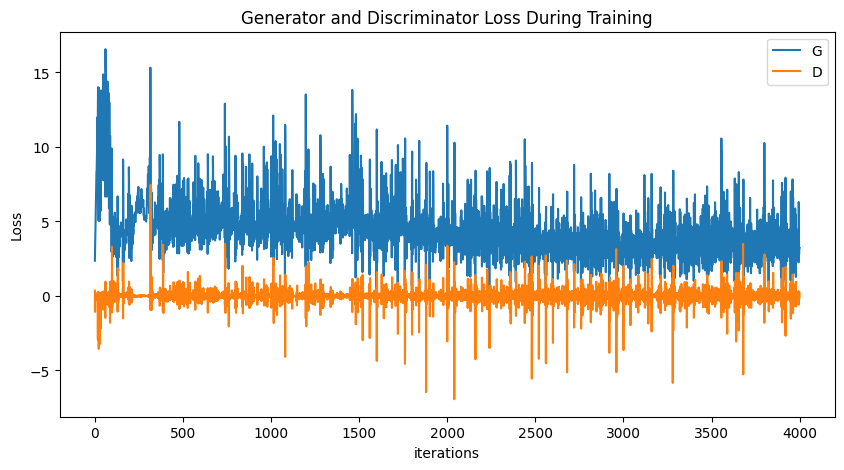

In [32]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label="G")
plt.plot(D_losses, label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

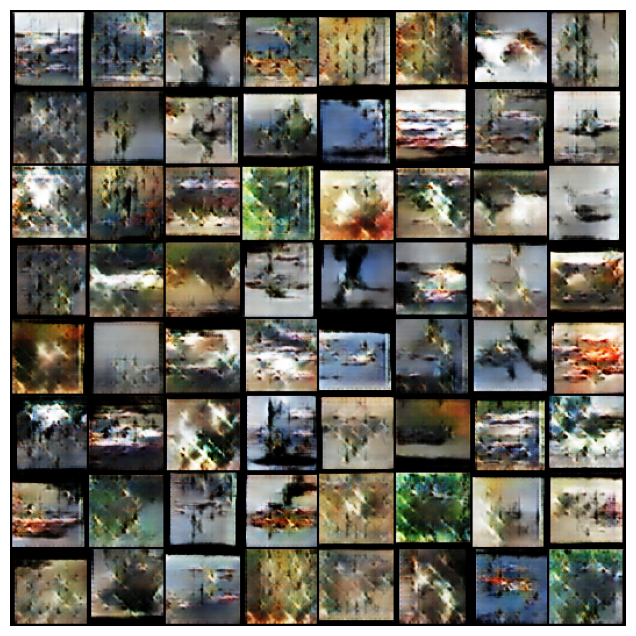

In [33]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

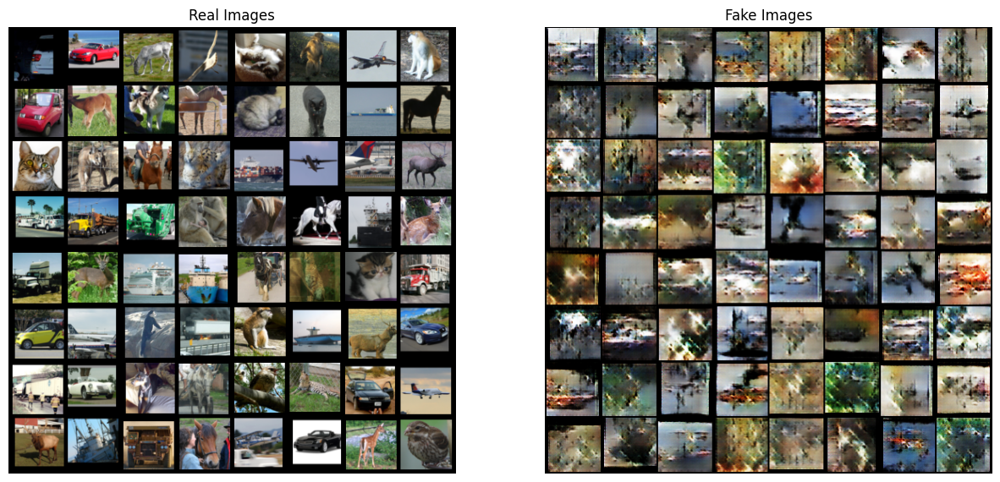

In [34]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(trainloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(), (1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1], (1,2,0)))
plt.show()

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import torch

# Assuming 'netG' is your trained generator and 'device' is properly set ('cuda' or 'cpu')
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def generate_images(generator, noise_dim, num_images=10):
    # Generate random noise vectors and repeat it for the number of images
    noise_ = torch.randn(num_images, noise_dim, 1, 1, device=device)  # Adjust for device and repeat along batch size
    generator.eval()  # Set generator to evaluation mode
    with torch.no_grad():
        fake_images = generator(noise_)
    
    return fake_images

# Generate images
num_images = 2000
noise_dim = 100  # Change this according to your DCGAN's noise dimension
generated_images = generate_images(netG, noise_dim, num_images)

# Visualize the images
def plot_generated_images(images, nrows, ncols):
    fig, axes = plt.subplots(nrows, ncols, figsize=(10, 10))
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(images[i].cpu().numpy().transpose(1, 2, 0).squeeze(), cmap='gray')
        ax.axis('off')
    plt.tight_layout()
    plt.show()



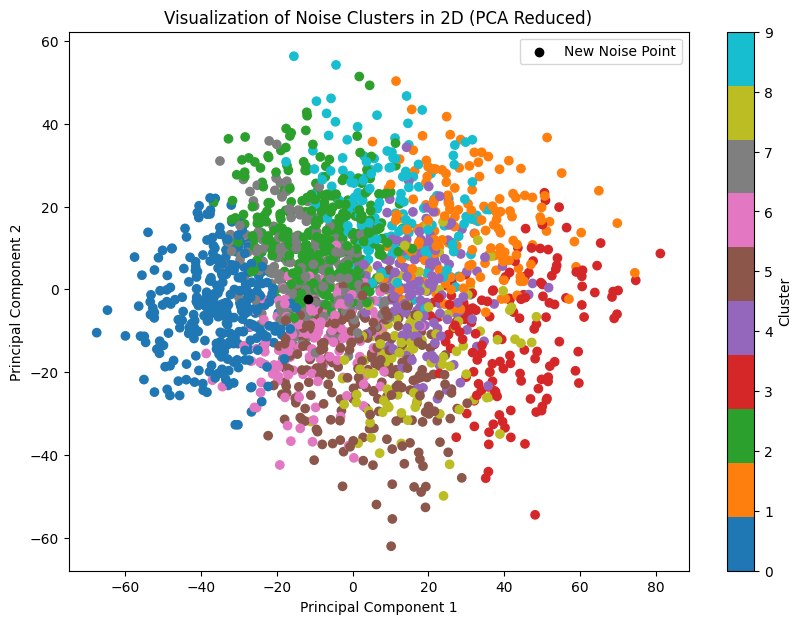

In [36]:
import torch
from sklearn.cluster import KMeans
from sklearn.neighbors import KDTree
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Generate the images (you've already done this)
# Assuming generated_images has shape (num_images, channels, height, width)

# Step 2: Flatten the generated images to shape (num_images, channels * height * width)
num_images, channels, height, width = generated_images.shape
noise_flattened = generated_images.view(num_images, -1).cpu().numpy()  # Flattening each image

# Step 3: Apply k-means clustering to classify into 10 groups
kmeans = KMeans(n_clusters=10, random_state=0)
kmeans.fit(noise_flattened)

# Step 4: Assign clusters to each noise point
labels = kmeans.labels_  # This contains the class (0-9) for each noise

# Step 5: Build a KDTree for efficient search of nearest neighbors (optional)
tree = KDTree(noise_flattened)

# Step 6: Dimensionality Reduction using PCA to 2D for visualization
pca = PCA(n_components=2)
noise_pca = pca.fit_transform(noise_flattened)

# Step 7: Plot the noise data points with their respective cluster labels
plt.figure(figsize=(10, 7))
scatter = plt.scatter(noise_pca[:, 0], noise_pca[:, 1], c=labels, cmap='tab10')
plt.title('Visualization of Noise Clusters in 2D (PCA Reduced)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(scatter, label='Cluster')

# Step 8 (Optional): Plot a new noise point
new_noise = torch.randn(1, noise_dim, 1, 1, device=device)  # New noise point
netG.eval()
with torch.no_grad():
    new_generated_image = netG(new_noise)
new_generated_image_ = new_generated_image.view(1, -1).cpu().numpy()  # Flatten the new image
new_noise_pca = pca.transform(new_generated_image_)  # Project new image to PCA space

# Add the new noise point to the plot
plt.scatter(new_noise_pca[:, 0], new_noise_pca[:, 1], color='black', label='New Noise Point')
plt.legend()

plt.show()


In [43]:
import os
from PIL import Image
import pandas as pd

print(os.getcwd())
# Set up the folder path and device
test_folder = "./test"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define the image transformations (resize, normalize, etc.)
transform = transforms.Compose([
    transforms.Resize((64, 64)),  # Resize images to 64x64, change this size as needed
    transforms.ToTensor(),        # Convert PIL image to tensor
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize the images (change mean/std as needed)
])

# Load the dataset
test_dataset = dset.ImageFolder(root=test_folder, transform=transform)

# Create the dataloader
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=128, shuffle=False)

# Assume your model is loaded and called netG
netG.eval()  # Set the model to evaluation mode

# Lists to store filenames and predictions
file_list = []
predictions = []

# Track the current index to avoid duplicate file names
current_index = 0

# Loop over the test dataloader
with torch.no_grad():
    for inputs, _ in test_loader:  # The "_" ignores the label since we don't need it
        inputs = inputs.to(device)
        
        # Make predictions with the model
        outputs = netD(inputs)
        # Round the predictions, move to CPU, and convert to NumPy array
        outputs = torch.round(outputs).cpu().numpy().squeeze().astype(int)  # .squeeze() removes extra dimensions
        
        # Get the file names using the global index to avoid duplicate names
        batch_files = [os.path.basename(test_loader.dataset.samples[i + current_index][0]) for i in range(len(inputs))]
        current_index += len(inputs)  # Update the global index by the size of the current batch
        
        # Store the results
        file_list.extend(batch_files)
        predictions.extend(outputs.tolist())  # Convert to list and store

# Create a DataFrame with filenames and predictions
df = pd.DataFrame({
    "Filename": file_list,
    "Real": predictions
})

# Save the DataFrame to a CSV file
df.to_csv("predictions3.csv", index=False)

print("Predictions saved to predictions3.csv")


/home/luis/Documents/UTEC/Deep_Learning/DCGAN
Predictions saved to predictions3.csv
